<h2 style='text-align:center;font-size:80px;background-color:purple;border:80px;color:white'>   Insurance Claim Fraud Detection Project . <h2>

# `Problem Statement:- `

## Business case:


## `Insurance fraud is a huGe problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.`

## `In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.`

## `In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.`

`-----------------------------------------------------------------------------------------------------------------`

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading the csv file from dataset
df = pd.read_csv("Automobile_insurance.csv")
pd.set_option("display.max_columns",None)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


### The dataset contains both categorical and numerical columns. Here "fraud_reported"is our traget column, since it has two categories so it termed to be "Classification Problem"where we need predict if an insurance claim is fraudulent or not.

## Here i see 0's and ? in the dataset which is needed to be treated also

### The Total number of Rows are 1000 and 40 Columns

In [3]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


## NaN value are present too in the dataset

In [4]:
df.sample(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
992,94,26,215278,24-10-2007,IN,100/300,500,722.66,0,433696,MALE,MD,exec-managerial,camping,husband,50300,0,23-01-2015,Multi-vehicle Collision,Front Collision,Major Damage,Fire,OH,Springfield,1705 Weaver St,6,3,YES,1,2,YES,36700,3670,7340,25690,Nissan,Pathfinder,2010,N,NaN
306,111,29,235869,22-01-2011,IL,250/500,500,1239.55,2000000,464736,FEMALE,PhD,farming-fishing,kayaking,own-child,0,0,09-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Fire,SC,Riverwood,2230 1st St,1,1,?,1,1,YES,52800,4800,9600,38400,Mercedes,ML350,1996,Y,NaN
761,440,57,648852,15-03-2007,IL,100/300,1000,995.55,5000000,604948,MALE,College,protective-serv,paintball,wife,51500,-52100,02-02-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Police,SC,Arlington,6668 Andromedia Ridge,19,3,YES,0,3,?,68200,12400,12400,43400,Jeep,Wrangler,2007,Y,NaN
673,80,28,998865,05-12-2014,IL,500/1000,1000,1740.57,0,442142,FEMALE,College,farming-fishing,golf,wife,0,-18600,20-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Police,SC,Northbend,4995 Weaver Ridge,3,1,?,0,1,?,33480,3720,3720,26040,Dodge,Neon,2011,N,NaN
991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,433981,MALE,MD,other-service,basketball,other-relative,59400,-32200,06-02-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,WV,Riverwood,5312 Francis Ridge,21,1,NO,0,1,NO,46980,0,5220,41760,Accura,TL,2002,N,NaN


In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [6]:
# Now lets identify which types of data types do they all belongs

df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

## We can see that our fraud_reported(target variable) columns is in Object type which make it a classification problem

<h2 style='text-align:center;font-size:50px;background-color:orange;border:50px;color:white'> EDA <h2>

In [7]:
# To get the information about the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

## Here we get the Information regarding Column,Non-Null Count(columns having NaN Values) ,Dtypes and Memory usage of the dataset .... Here we can see that all the columns counts are equal except _c39 which means that there is no Missing values except in one columns

# NOW LETS CHECK THE NULL VALUES

In [8]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

## All the columns have 0 Null value except _c39 which have all value as Null 

## But we have data values present in ? which is also a null value

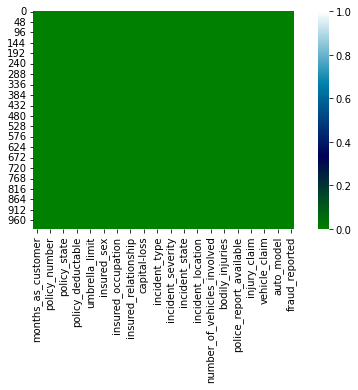

In [9]:
# Let's visualize NaN values
sns.heatmap(df.isnull(),cmap="ocean")
plt.show()

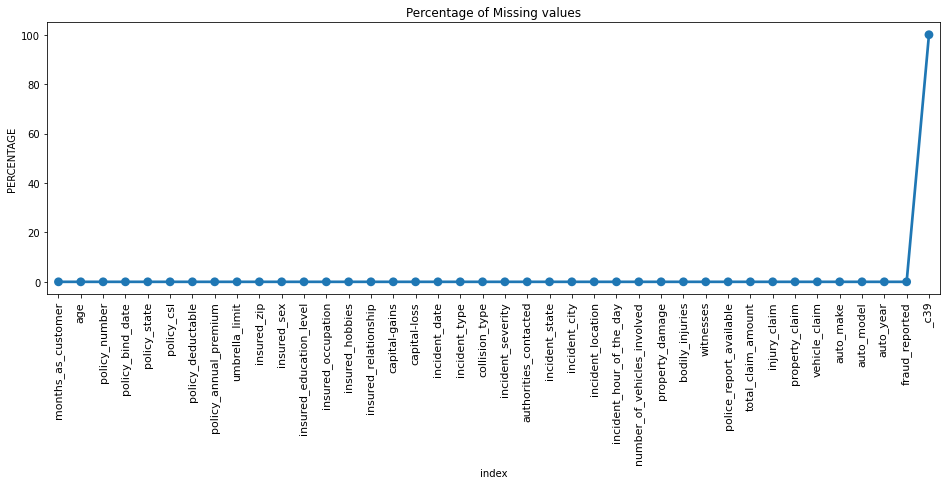

In [10]:
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =11)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

## We have NaN value in _c39 Which is required to be Removed

In [11]:
# Dropping _c39 column
df.drop("_c39",axis=1,inplace=True)

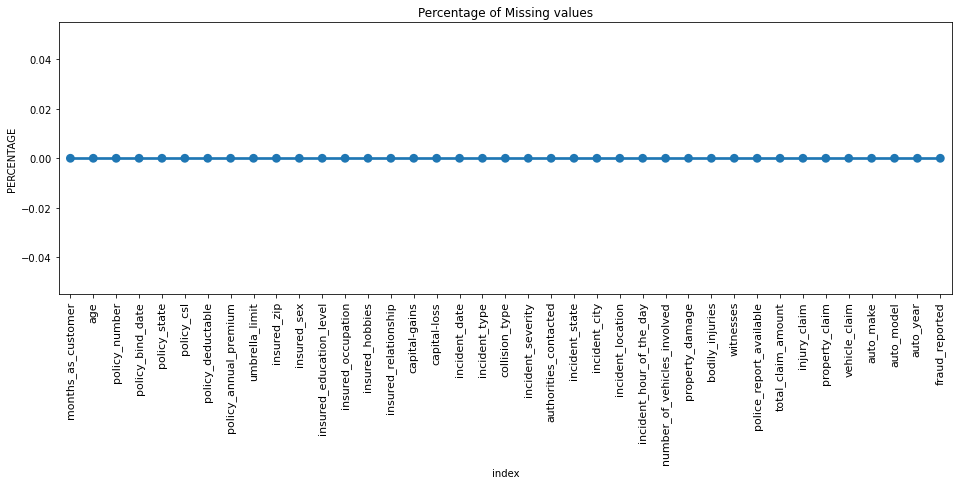

In [12]:
# Lets Check again whether it has any Null value or not
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =11)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

In [13]:
# Value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('\n\n')
        print ('*'*100)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64



****************************************************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64



****************************************************************************************************
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64



********************

## Observation

- **In Collision type we have ? which is needed to be corrected**
- **In property damage we have ? present**
- **police_report_available have ? present**
- **By looking at the value counts of each column we can realize that the columns umbrella_limit, capital-gains and capital-loss contains more zero values and it is more than and around 50%**.
- **umbrella_limit columns has more that 70% of zero values, let's drop that column**.

In [14]:
# Checking which columns contains "?" sign as it is a NaN value
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

## These are the columns which contains "?" sign. We see these column  to be categorical so we will replace "?" values with most frequently occuring values of the respective columns that is their mode values.

In [15]:
# Dropping umbrella_limit column
df.drop("umbrella_limit",axis=1,inplace=True)

In [16]:
# Checking number of unique values in each column
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
insured_zip,995
insured_sex,2


### These are the unique values present in each column.We can observe the columns policy_number and incident_location have 1000 unique values which means they have only one value count. So it not required for the prediction so we can drop it.

In [17]:
# Dropping policy_number and incident_location columns
df.drop("policy_number",axis=1,inplace=True)
df.drop("incident_location",axis=1,inplace=True)

## Converting into Datetime format

In [18]:
# Converting Date columns from object type into datetime data type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [19]:
# Extracting Day, Month and Year column from policy_bind_date
df["policy_bind_Day"] = df['policy_bind_date'].dt.day
df["policy_bind_Month"] = df['policy_bind_date'].dt.month
df["policy_bind_Year"] = df['policy_bind_date'].dt.year

In [20]:
# Extracting Day, Month and Year column from incident_date
df["incident_Day"] = df['incident_date'].dt.day
df["incident_Month"] = df['incident_date'].dt.month
df["incident_Year"] = df['incident_date'].dt.year

## Now we have extracted Day, Month and Year columns from both policy_bind_date and incident_date columns.

In [21]:
# Dropping policy_bind_date and incident_date columns
df.drop(["policy_bind_date","incident_date"],axis=1,inplace=True)

## We have dropped the columns policy_bind_date and incident_date as we have extracted the required data from those columns.

In [22]:
# Checking which columns contains "?" sign as it is a NaN value
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [23]:
df["collision_type"].mode()

0    Rear Collision
Name: collision_type, dtype: object

In [24]:
df["property_damage"].mode()

0    ?
Name: property_damage, dtype: object

In [25]:
df["police_report_available"].mode()

0     ?
1    NO
Name: police_report_available, dtype: object

### The mode of property_damage and police_report_available is "?", which means the data is almost covered by "?" sign. So we will fill them by the second highest count of the respective column. ( ?      360 , NO     338 -> in property damage)  and (?      343 , NO     343 in police report available) ,so in these case we will go with "NO"


In [26]:
# Replacing "?" by their mode values
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [27]:
print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64



The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64



The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


### Here we can see that we have removed the "?" from the dataset and have filled it with proper data types values

In [28]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,OH,250/500,1000,1406.91,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,9,6,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015
4,228,44,IL,500/1000,1000,1583.91,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,6,2014,17,2,2015


# Separating numerical and categorcal columns

In [29]:
# Checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)


Categorical columns are:
 ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [30]:
# Now checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year', 'incident_Day', 'incident_Month', 'incident_Year']


## These are the catagorical and Numerical Columns present in the dataset

In [31]:
# Checking the list of counts of target
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [32]:
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

## So here we can see  that my dataset is imbalanced so will balance it with SMOTE Technique

In [33]:
# Checking wheather the target vaiable contains any space
df.loc[df['fraud_reported']==" "]

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year


## So here we can see that no space is present in the dataset

In [34]:
df.shape

(1000, 40)

In [35]:
# Check any duplicate data is present or not, If present then we will drop them.
df=df.drop_duplicates()

In [36]:
df.shape

(1000, 40)

## So we can see that 0 Duplicate values are present in the dataset

<h2 style='text-align:center;font-size:50px;background-color:green;border:50px;color:black'> A. Univariate Analysis <h2>

In [37]:
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'insured_zip',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'policy_bind_Day', 'policy_bind_Month',
       'policy_bind_Year', 'incident_Day', 'incident_Month', 'incident_Year'],
      dtype='object')

## Plotting catagorical columns 1st

### Categorical columns are:
 `['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']`

## There are 40 columns so we cannot plot every single columns seperately ,it will consume a lot of time

Value Count :-  N    753
Y    247
Name: fraud_reported, dtype: int64


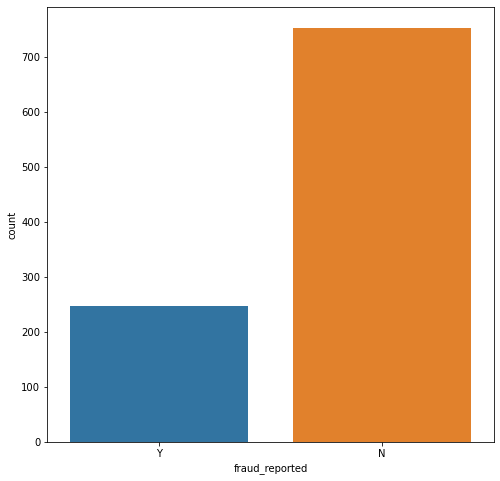

In [38]:
plt.figure(figsize=(8,8))
sns.countplot(df['fraud_reported'])
print ('Value Count :- ',df['fraud_reported'].value_counts())

### Here the count of No is more than yes . . And the count of yes is only 247 and No is 753 plus .. Here "Yes" means Frauds have been taken place and "No" means no frauds have been taken place

# `Visualizing the data Using Pie Chart`

In [39]:
def generate_pie(i):
    plt.figure(figsize=(10,5),facecolor='orange')
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

In [40]:
cols1 = ['policy_state', 'insured_sex', 'insured_education_level','insured_relationship', 'incident_type','collision_type','property_damage','police_report_available']


Pie plot for the column: policy_state


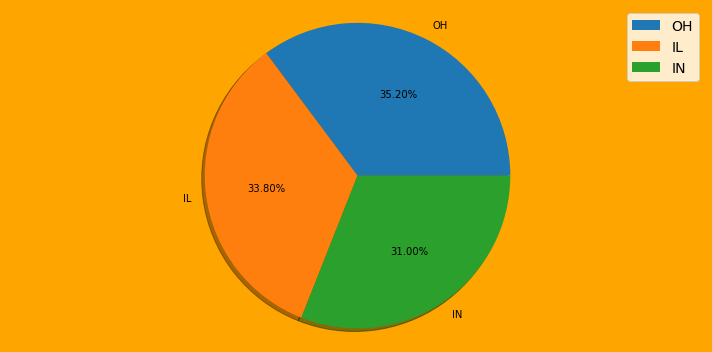

Pie plot for the column: insured_sex


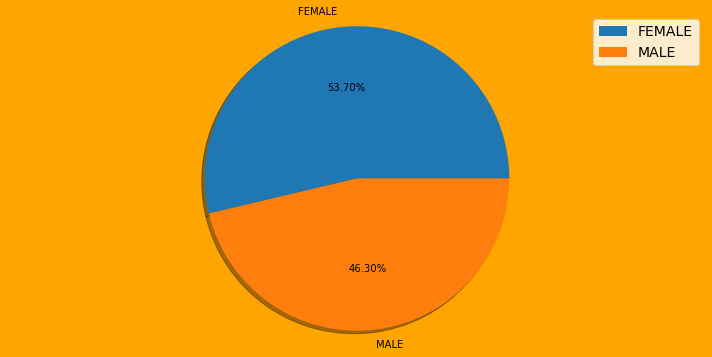

Pie plot for the column: insured_education_level


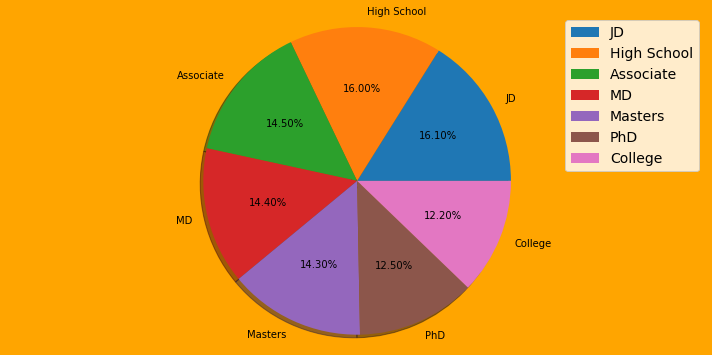

Pie plot for the column: insured_relationship


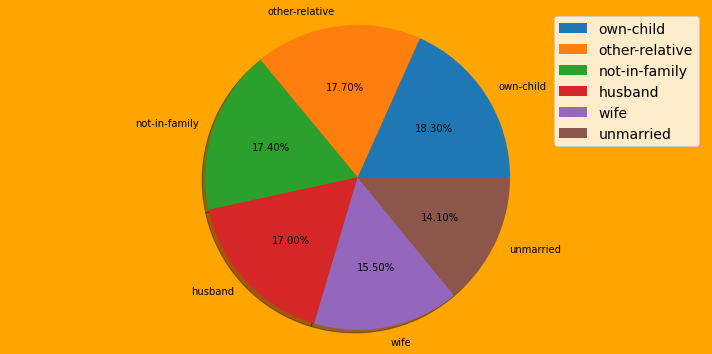

Pie plot for the column: incident_type


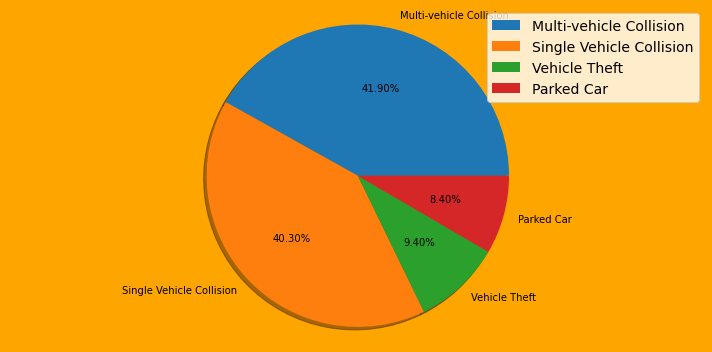

Pie plot for the column: collision_type


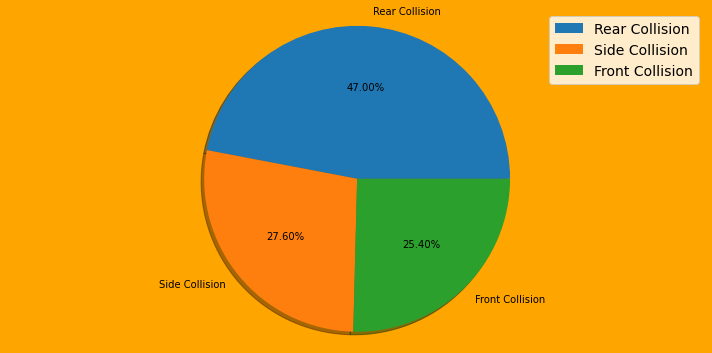

Pie plot for the column: property_damage


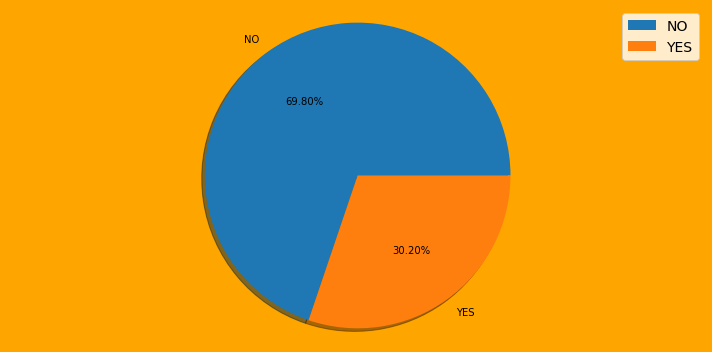

Pie plot for the column: police_report_available


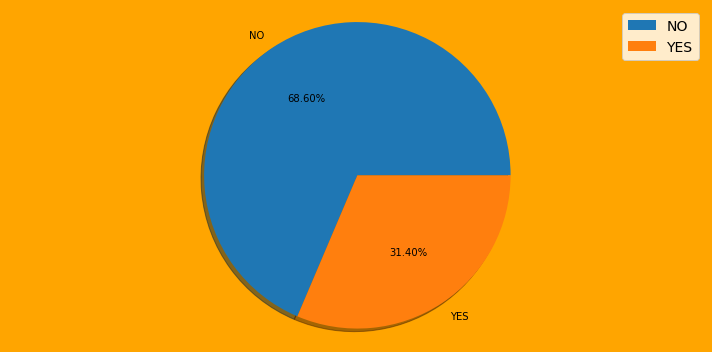

In [41]:
plotnumber=1
for j in df[cols1]:
    print(f"Pie plot for the column:", j)
    generate_pie(df[j])

# `Above are the pie plots for some of the categorical columns. From the above pie plots we can observe the following things:`

- **The types of the policies claimed by the customers are almost same but still the policy state type HO has bit high counts and the type IL has bit less count.**
- **Both male and female have insurance but the count for Female is bit higher than Male counts.**
- **The count is pretty much same for all the education level but still the people who have completed their college and PhD have less count compared to others.**
- **Similar to insured education, insured relationship is also almost equally distributed.**
- **While looking at the incident type, Multi-vehicle collision and Single Vehicle Collision have pretty much similar counts of around 41% and 400%. But the count is very less in Parked car and Vehicle Theft.**
- **The collision type has 3 different types . In this the count is high in Rear collision and the other two types have almost equal counts.**
- **As we observe the propert damage plot, around 69% of the people did not face any property damage while 30% of the people faced the property damage.**
- **Over 68% of the people were produced the police reports while 31% of the people didn't submit any police reports.**

# `Visiualizing with Count Plot`

In [42]:
cols2 = ['insured_occupation', 'insured_hobbies', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city','auto_make', 'auto_model']

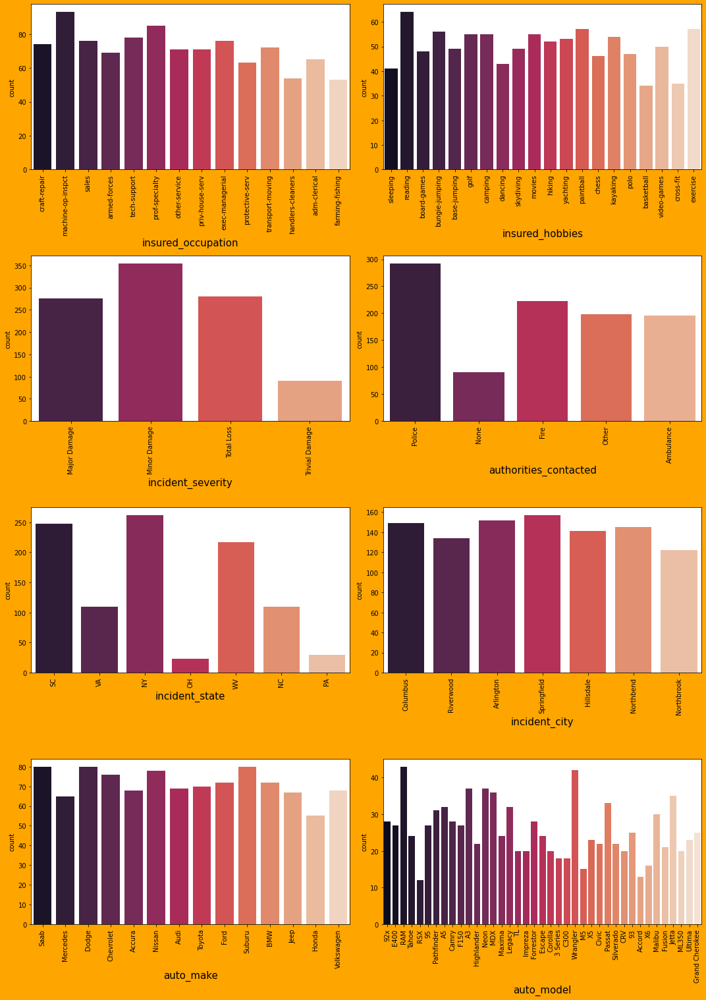

In [43]:
plt.figure(figsize=(15,25),facecolor='orange')
plotnumber=1
for column in cols2:
    if plotnumber:
        ax=plt.subplot(5,2,plotnumber)
        sns.countplot(df[column],palette="rocket")
        plt.xticks(rotation=90)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

### Above are the count plots for the remaining categorical columns. From the count plots we can observe the following things:- 

- **In the insured occupation we can observe most of the data is covered by machine operation inspector followed by professional speciality. Apart from this all the other insured occupations have almost same couns.**
- **With respect to insured hobbies, we can notice reading covered the highest data followed by exercise. And other categories have the average counts.**
- **The incodent severity count is high for Minor damages and trivial damage data has very less count compared to others.**
- **When the accidents occurs then most of the authorities contacts the police, here the the category police covers highest data and Fire having the second highest count. But Ambulance and Others have almost same counts and the count is very less for None compared to all.**
- **With respect to the incident state, New York, South Carolina and West Virginia states have highest counts.**
- **In incident city, almost all the columns have equal counts.**
- **When we look at the vehicle manufactured companies, the categories Saab, Suburu, Dodge, Nissan and Volkswagen have highest counts.**
- **When we take a look at the vehicle models then RAM and Wrangler automobile models have highest counts and also RSX and Accord have very less count.**

<h2 style='text-align:center;font-size:50px;background-color:green;border:50px;color:black'> B. Bivariate Analysis <h2>

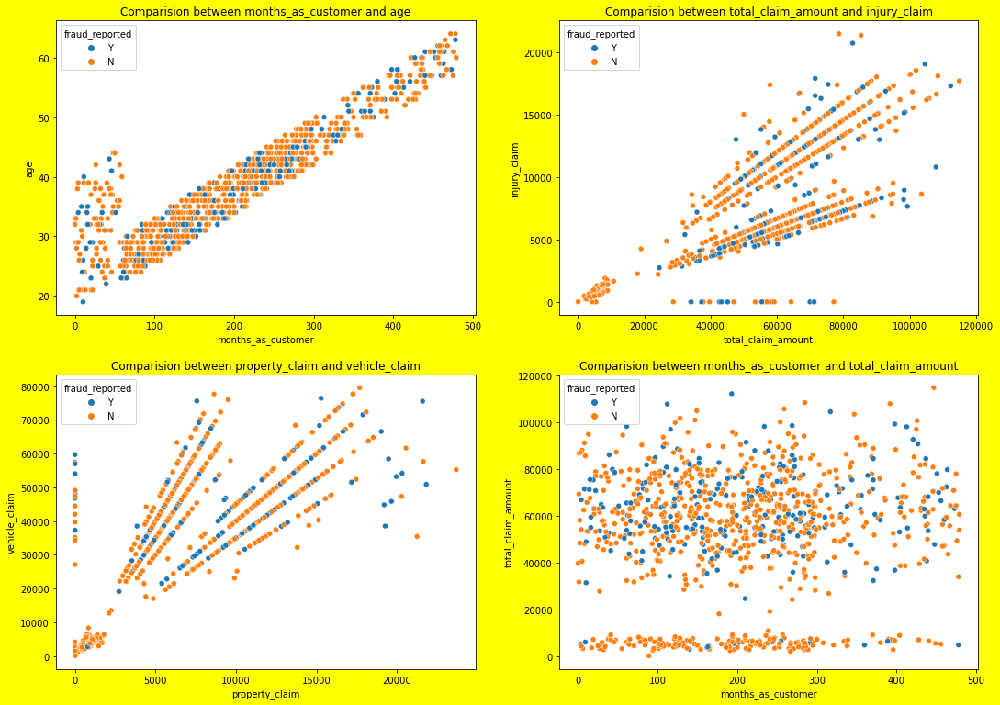

In [44]:
# Comparision between two variables
plt.figure(figsize=[18,13],facecolor='yellow')

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

### From the above scatter plot we can observe the following things:-

- **There is a positive linear relation between age and month_as_customer column. As age increases the month_as customers also increases, also the fraud reported is very less in htis case.**
- **In the second graph we cna observe the positive linear relation, as total cliam amount increases, injury claim is also increases.**
- **Third plot is also same as second one that is as the property claim increases, vehicle claim is also increases.**
- **In the fourth plot we can observe the data is scattered and there is no much relation between the features.**

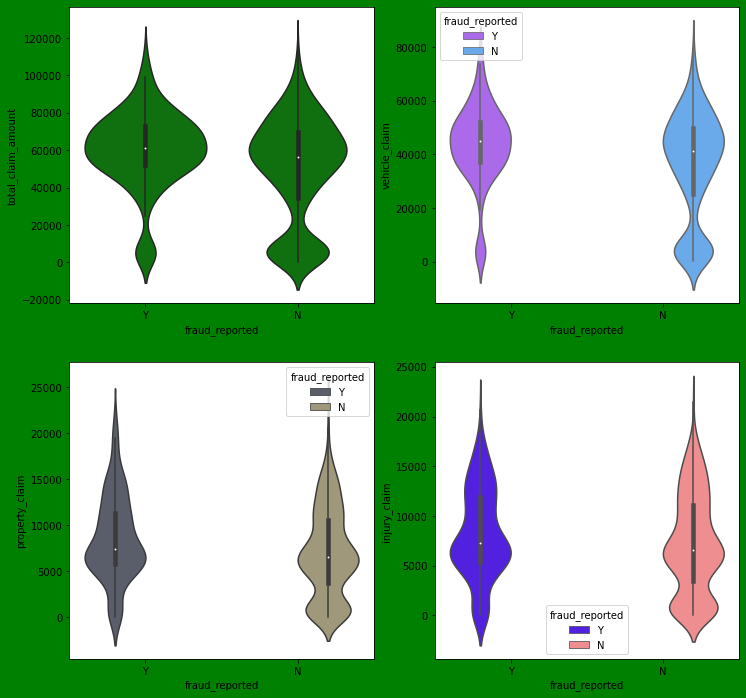

In [45]:
fig,axes=plt.subplots(2,2,figsize=(12,12),facecolor='green')

# Comparing insured_sex and age
sns.violinplot(x='fraud_reported',y='total_claim_amount',ax=axes[0,0],data=df,color="g")

# Comparing policy_state and witnesses
sns.violinplot(x='fraud_reported',y='vehicle_claim',ax=axes[0,1],data=df,hue="fraud_reported",palette="cool_r")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='fraud_reported',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",palette="cividis")

# Comparing csl_per_person and age
sns.violinplot(x='fraud_reported',y='injury_claim',ax=axes[1,1],data=df,hue="fraud_reported",palette="gnuplot2")
plt.show()

##  Observation :- 

- **Most of the fraud reports found when the total claimed amount is 5000-70000.**
- **The fraud report is high when the claimed vehicle is between 3700-5900.**
- **The fraud reports is high when the property claimed is between 5200-8500.**
- **Most fraud reported when injury claim are between 5000 to 8000.**

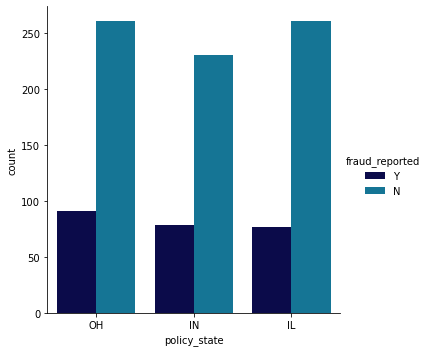

In [46]:
# Comparing policy_state and fraud_reported
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="ocean")
plt.show()

## Fraud report is bit high in the "OH" policy state.

<Figure size 576x576 with 0 Axes>

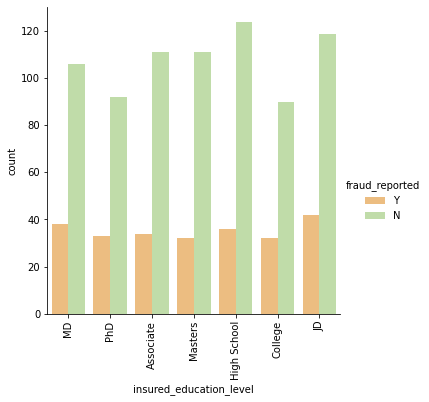

In [47]:
# Comparing insured_education_level and fraud_reportedplt.figure(figsize=(10,5),facecolor='orange')plt.figure(figsize=(10,5),facecolor='orange')
plt.figure(figsize=(8,8))
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="Spectral")
plt.xticks(rotation=90)
plt.show()

## The fraudulent level is very less for the people who have high school education and the people who have completed their "JD" education have high fraud report. The people who have high insured education are facing insurance fraudulent compared to the people with less insured education level.

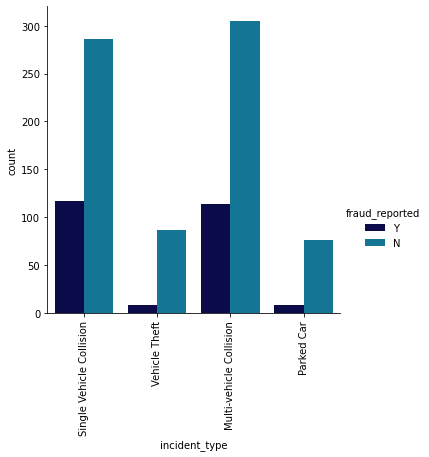

In [48]:
# Comparing incident_type and fraud_reported
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="ocean")
plt.xticks(rotation=90)
plt.show()

### In Multivehicle collission and single vehicle collision, the fraud report is very high compared to others

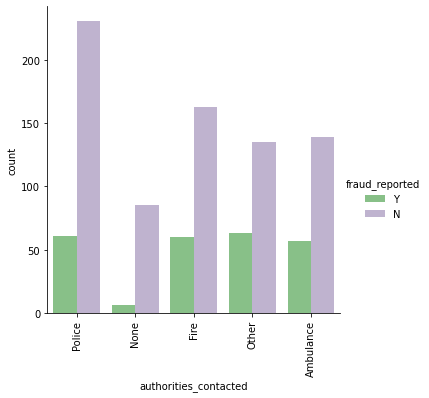

In [49]:
# Comparing authorities_contacted and fraud_reported
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="Accent")
plt.xticks(rotation=90)
plt.show()

### The police contacted cases are very high and the fraud report is in equal for all the authorities except None.

<Figure size 720x360 with 0 Axes>

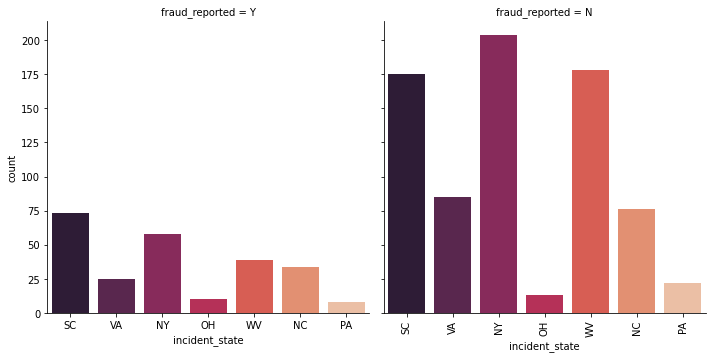

In [50]:
# Comparing incident_state and fraud_reported
plt.figure(figsize=(10,5),facecolor='orange')
sns.factorplot('incident_state',kind='count',data=df,col='fraud_reported',palette="rocket")
plt.xticks(rotation=90)
plt.show()

## The state SC has high fraud reports compared to other states.

<h2 style='text-align:center;font-size:50px;background-color:green;border:50px;color:black'> C. Multivariate Analysis <h2>

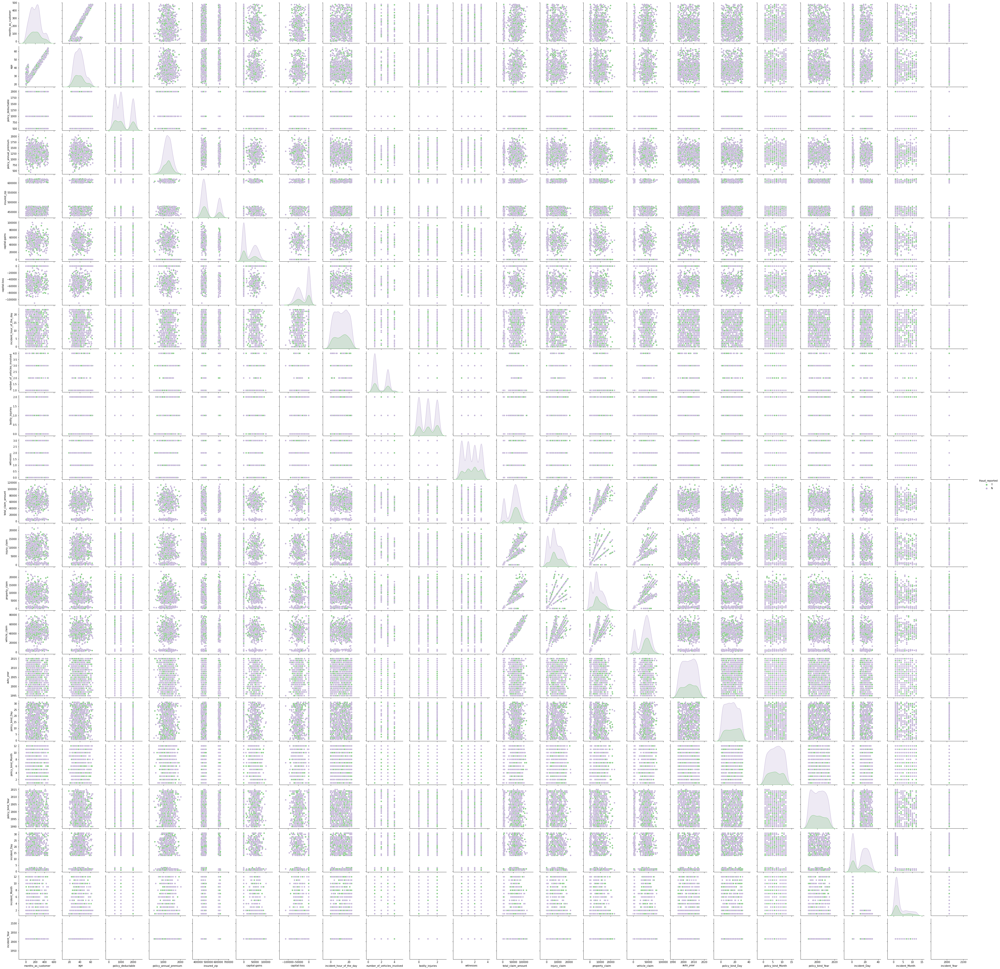

In [51]:
sns.pairplot(df,hue="fraud_reported",palette="Accent")
plt.show()

### This pair plot gives the pairwise relation between the columns which is plotted on the basis of target variable "fraud_reported". Here we can observe the relation between the features and label

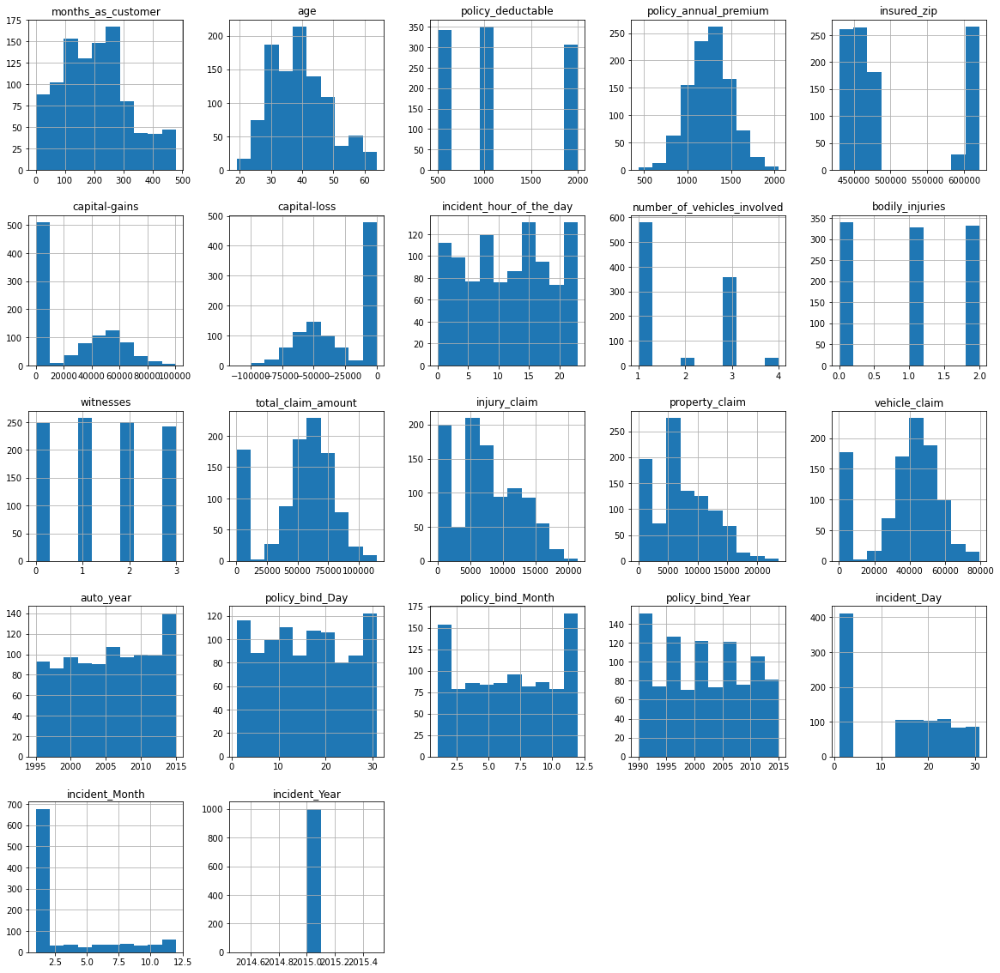

In [52]:
df.hist(bins=10, figsize=(20,20))
plt.show()

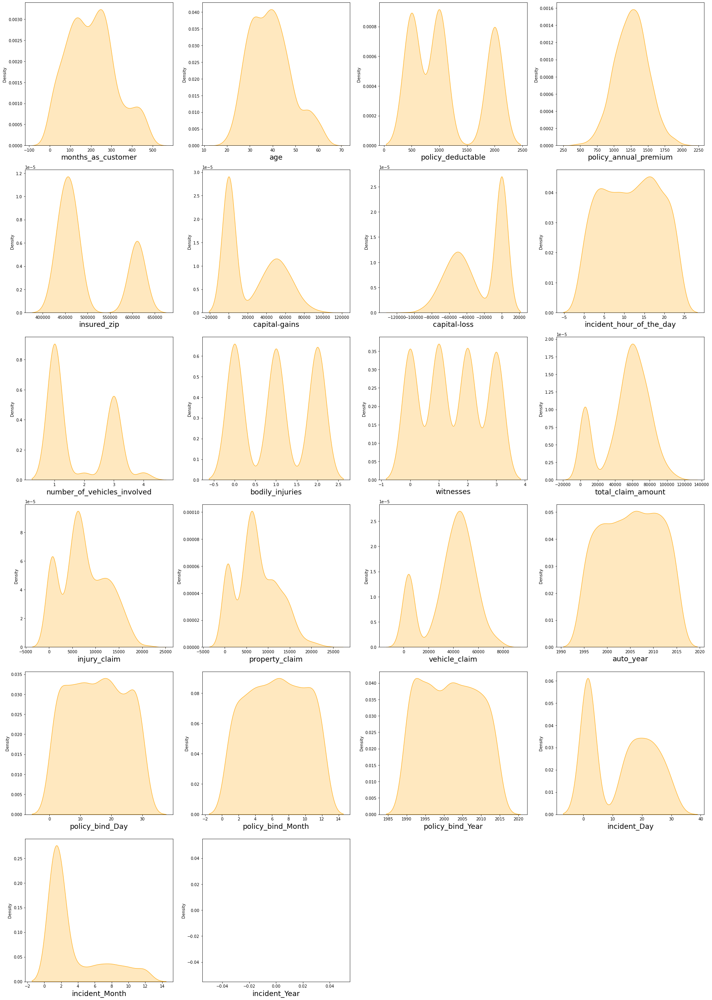

In [53]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color="orange",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

### Above are the distribution plots for all the numerical columns. From the distplots we can observe the following things:

- The data is normally distributed in most of the columns.
- Some of the columns like capital gains and incident months have mean value greater than the median, hence they are skewed to right.
- The data in the column capital loss is skewed to left since the median is greater than the mean.

**We will remove the skewness using appropriate methods in the later part.**

months_as_customer                AxesSubplot(0.125,0.816017;0.133621x0.0639831)
age                            AxesSubplot(0.285345,0.816017;0.133621x0.0639831)
policy_deductable               AxesSubplot(0.44569,0.816017;0.133621x0.0639831)
policy_annual_premium          AxesSubplot(0.606034,0.816017;0.133621x0.0639831)
insured_zip                    AxesSubplot(0.766379,0.816017;0.133621x0.0639831)
capital-gains                     AxesSubplot(0.125,0.739237;0.133621x0.0639831)
capital-loss                   AxesSubplot(0.285345,0.739237;0.133621x0.0639831)
incident_hour_of_the_day        AxesSubplot(0.44569,0.739237;0.133621x0.0639831)
number_of_vehicles_involved    AxesSubplot(0.606034,0.739237;0.133621x0.0639831)
bodily_injuries                AxesSubplot(0.766379,0.739237;0.133621x0.0639831)
witnesses                         AxesSubplot(0.125,0.662458;0.133621x0.0639831)
total_claim_amount             AxesSubplot(0.285345,0.662458;0.133621x0.0639831)
injury_claim                

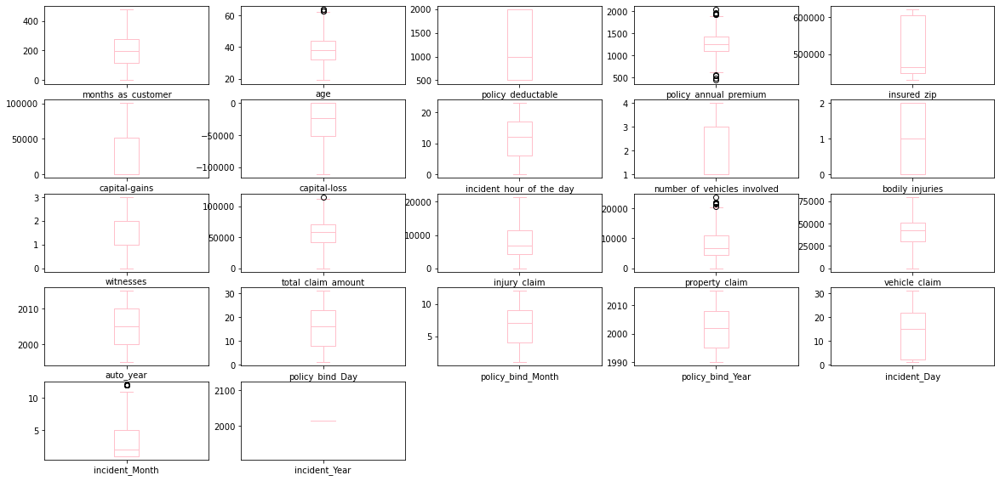

In [54]:
df.plot(kind='box',subplots=True,layout=(10,5),figsize=(20,20),color='pink')

## We can find some Outliers  present in the dataset ..( Age ,policy_annual_premium,property_claim,incident_month) are the columns which are having Outliers

<h2 style='text-align:center;font-size:50px;background-color:black;border:50px;color:green'> CORRELATION <h2>

In [55]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available  

# Lets Convert all catagorical columns to Numerical by Encoding Tech

In [58]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in df.columns:
    if df[i].dtypes=="object":
        df[i]=le.fit_transform(df[i].values.reshape(-1,1))
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,2,1,1000,1406.91,466132,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1,17,10,2014,25,1,2015
1,228,42,1,1,2000,1197.22,468176,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,12,2007,1,27,6,2006,21,1,2015
2,134,29,2,0,2000,1413.14,430632,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0,9,6,2000,22,2,2015
3,256,41,0,1,2000,1415.74,608117,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,34,2014,1,25,5,1990,1,10,2015
4,228,44,0,2,1000,1583.91,610706,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,2009,0,6,6,2014,17,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,431289,0,5,2,13,4,0,0,2,0,1,1,0,4,20,1,1,0,1,0,87200,17440,8720,61040,6,6,2006,0,16,7,1991,22,2,2015
996,285,41,0,0,1000,1436.79,608177,0,6,9,17,5,70900,0,2,1,0,1,4,3,23,1,1,2,3,0,108480,18080,18080,72320,13,28,2015,0,1,5,2014,24,1,2015
997,130,34,2,1,500,1383.49,442797,0,5,1,3,2,35100,0,0,2,1,4,0,0,4,3,0,2,3,1,67500,7500,7500,52500,11,19,1996,0,17,2,2003,23,1,2015
998,458,62,0,2,2000,1356.92,441714,1,0,5,0,5,0,0,2,1,0,3,1,0,2,1,0,0,1,1,46980,5220,5220,36540,1,5,1998,0,18,11,2011,26,2,2015


In [59]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.017895,0.060925,-0.000833,0.009814,-0.093661,0.069727,0.006399,0.020209,-0.017377,-0.072787,-0.059581,0.010021,0.005369,-0.000130,0.070639,0.014736,0.005488,-0.010162,0.058383,-0.022146,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,0.051728,0.005750,-0.048276,-0.011092,0.024659,NaN
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.025604,0.073337,0.000969,0.017220,-0.081315,0.074832,-0.007075,0.007368,-0.025626,-0.075642,-0.058439,0.015417,0.005770,-0.002291,0.087161,0.022102,-0.003408,-0.015679,0.052359,-0.020441,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,0.053869,0.015501,-0.037444,-0.006131,0.023404,NaN
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,0.008777,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074551,-0.030338,0.031848,0.052438,-0.026377,-0.016777,0.008723,-0.002077,0.029457,-0.042263,-0.008465,0.013384,0.022960,0.069017,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,0.002277,0.071450,-0.007276,0.014745,0.023643,NaN
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.006879,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.005249,-0.034612,0.011997,0.020641,0.022530,0.056182,0.032814,0.009333,-0.001869,-0.019403,-0.027634,-0.000595,0.071500,-0.001645,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,0.018973,-0.045345,-0.016466,-0.004156,-0.011794,NaN
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.004545,-0.009733,0.015217,-0.046733,0.004061,-0.022945,0.035212,-0.023544,-0.038411,-0.053912,-0.015711,-0.000760,0.006517,-0.045117,0.060935,0.051214,0.015770,-0.022765,0.066639,0.038036,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.009164,-0.050416,-0.049598,-0.018160,-0.006418,NaN
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,0.032354,0.038853,-0.019715,0.035922,-0.018019,0.001925,-0.013738,0.023547,0.053603,0.036556,-0.011155,-0.055191,0.046434,0.048724,-0.001578,-0.045991,0.080738,0.026780,0.002332,0.021998,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.025183,-0.035355,0.001249,0.014835,0.021559,NaN
insured_zip,0.017895,0.025604,0.008777,0.006879,0.004545,0.032354,1.000000,-0.036942,0.016079,-0.069077,0.002106,-0.002355,0.006303,0.049372,-0.010840,-0.016882,-0.023855,-0.017548,-0.047669,-0.017532,0.008274,0.027448,0.023861,0.028695,0.019805,0.009841,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368,-0.039867,0.015864,-0.001100,0.019095,0.005461,NaN
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,-0.036942,1.000000,0.009002,-0.006160,-0.020317,0.002855,-0.020494,-0.021705,0.009952,-0.014293,-0.028168,0.017914,-0.022379,0.014470,0.019290,0.018793,0.026969,-0.020297,0.042463,0.006992,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873,0.040713,-0.004033,-0.032891,-0.007280,0.024227,NaN
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,0.016079,0.009002,1.000000,-0.020298,0.021807,-0.023488,0.039912,0.041193,0.013704,-0.019230,-0.006420,-0.010838,-0.005903,-0.018636,-0.057061,-0.003768,-0.048909,-0.012072,0.019211,0.051640,0.07422

## Here we can see correlation of all the columns to target variable

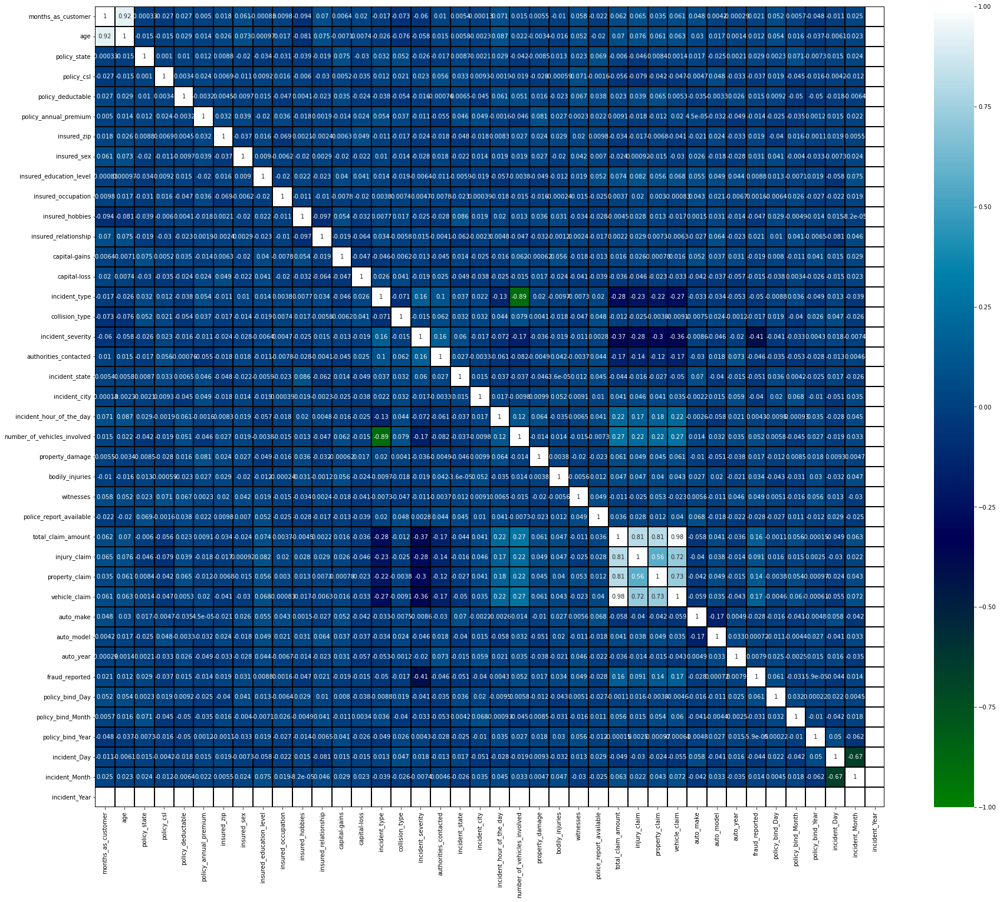

In [65]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(30,25))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.2g', annot = True, linecolor="black",annot_kws={'size':10},cmap="ocean")
plt.yticks(rotation=0);

### This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between feature to feature and feature to label. This heat mapcontains both positive and negative correlation.

In [64]:
df.corr()['fraud_reported'].sort_values()

incident_severity             -0.405988
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_Day                  -0.044151
incident_city                 -0.040403
policy_csl                    -0.037190
policy_bind_Month             -0.030829
police_report_available       -0.027768
auto_make                     -0.027519
capital-gains                 -0.019173
collision_type                -0.017315
capital-loss                  -0.014863
policy_annual_premium         -0.014480
policy_bind_Year              -0.000059
auto_model                     0.000720
insured_occupation             0.001564
incident_hour_of_the_day       0.004316
auto_year                      0.007928
insured_education_level        0.008808
age                            0.012143
incident_Month                 0.014495
policy_deductable              0.014817
property_damage                0.017202


## We can see that in column incident_year ,it has NaN correlation to  fraud_reported or target variable 

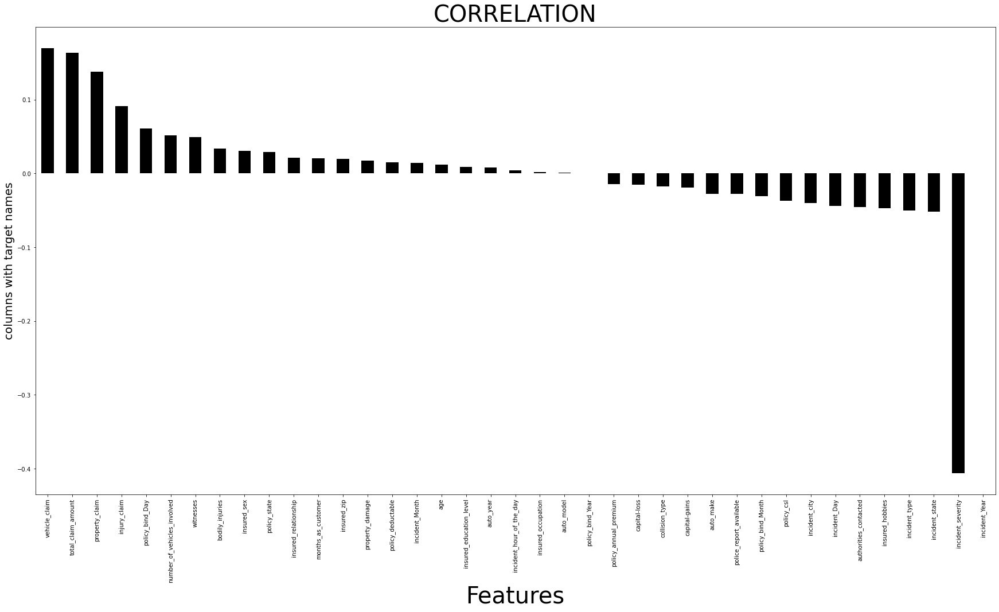

In [72]:
#checking the columns which are positively and negatively correlated

plt.figure(figsize=(30,15))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='black')
plt.xlabel('Features',fontsize=40)
plt.ylabel('columns with target names',fontsize=20)
plt.title('CORRELATION',fontsize=40)
plt.show()

## Here we can see the least correlated columns are-> policy_bind_year and auto_model and the max postive and Negative correlated columns as  Vechicle_claim and incident_severity. Incident _year has NaN correlation to target variable

In [73]:
# Dropping incident_Year column because it has NaN values to target variable
df.drop("incident_Year",axis=1,inplace=True)

In [74]:
# Dropping policy_bind_Year as it is least correlated 
df.drop("policy_bind_Year",axis=1,inplace=True)

In [75]:
# Dropping auto_model as it is one of least correlated 
df.drop("auto_model",axis=1,inplace=True)

<h2 style='text-align:center;font-size:60px;background-color:green;border:40px;color:black'> DESCRIPTIVE STATISTICS <h2>

In [76]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,203.95400,115.113174,0.00,115.7500,199.5,276.250,479.00
age,1000.0,38.94800,9.140287,19.00,32.0000,38.0,44.000,64.00
policy_state,1000.0,1.01400,0.830960,0.00,0.0000,1.0,2.000,2.00
policy_csl,1000.0,0.95100,0.804516,0.00,0.0000,1.0,2.000,2.00
policy_deductable,1000.0,1136.00000,611.864673,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1256.40615,244.167395,433.33,1089.6075,1257.2,1415.695,2047.59
insured_zip,1000.0,501214.48800,71701.610941,430104.00,448404.5000,466445.5,603251.000,620962.00
insured_sex,1000.0,0.46300,0.498879,0.00,0.0000,0.0,1.000,1.00
insured_education_level,1000.0,2.96600,1.948497,0.00,1.0000,3.0,5.000,6.00
insured_occupation,1000.0,6.65300,4.019048,0.00,3.0000,7.0,10.000,13.00


# We can see all columns having count 1000. Looks like it doesn't contain missing values

<AxesSubplot:>

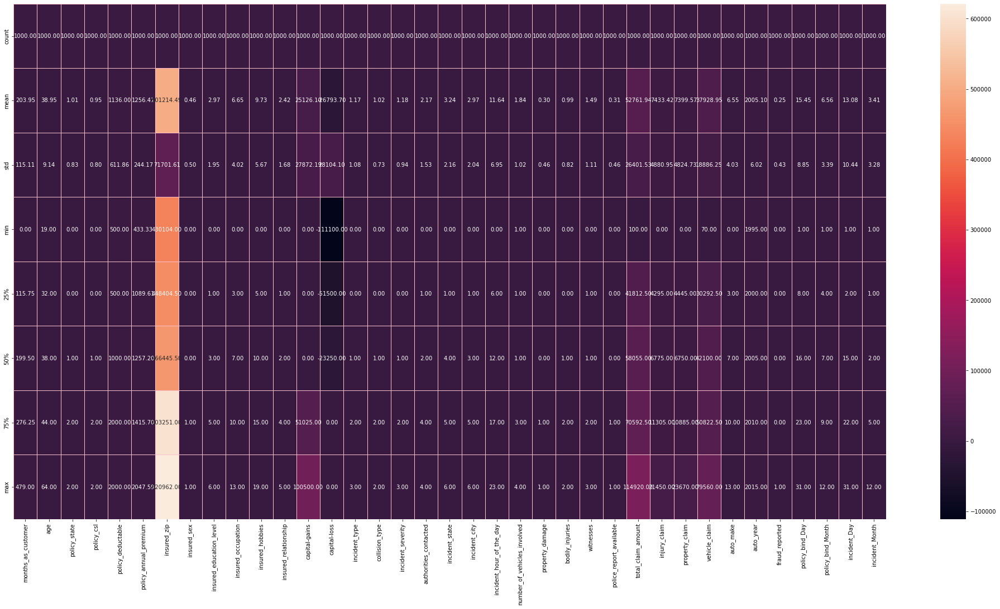

In [79]:
plt.figure(figsize=(35,17))
sns.heatmap(df.describe(),annot=True,linewidths=0.5,linecolor="pink",fmt="0.2f")

In [80]:
df.shape

(1000, 37)

## Outcome of describe() of dataset :-

**from the above plotting we are determining mean,standard deviation,minimum and maximum value of each column**

**Total number rows and column in dataset:-**

**`Rows :- 1000`**

**`columns :- 37`**

<h2 style='text-align:center;font-size:50px;background-color:orange;border:50px;color:black'> Lets Check Skewness <h2>


In [81]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.863806
bodily_injuries                0.014777
witnesses                      0.019636


#### Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year', 'incident_Day', 'incident_Month', 'incident_Year']

## `[insured_zip,number_of_vehicles_involved,total_claim_amount,vehicle_claim ,incident_Month]` have Skewness and it is needed to be removed ,Rest all columns which are showing skewness are catagorical columns and in this we are not required to remove skewness.. 

## <h2 style='text-align:center;font-size:50px;background-color:Black;border:30px;color:green'> Now Lets Remove Outliers Now <h2>

# ZSCORE METHOD

In [84]:
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'insured_zip',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_year',
       'fraud_reported', 'policy_bind_Day', 'policy_bind_Month',
       'incident_Day', 'incident_Month'],
      dtype='object')

In [85]:
# Features containing outliers
features = df[["age" ,"policy_annual_premium","property_claim","incident_Month"]]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

,age,policy_annual_premium,property_claim,incident_Month
0,0.990836,0.616705,1.165505,0.735040
1,0.334073,0.242521,1.372696,0.735040
2,1.088913,0.642233,0.736072,0.429664
3,0.224613,0.652886,0.219722,2.013343
4,0.552994,1.341980,1.399654,0.429664
...,...,...,...,...
995,0.103769,0.222884,0.273817,0.429664
996,0.224613,0.739141,2.214794,0.735040
997,0.541611,0.520739,0.020826,0.735040
998,2.523284,0.411866,0.451976,0.429664


In [86]:
# Creating new dataframe
df_new = df[(z<3).all(axis=1)] 
df_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month
0,328,48,2,1,1000,1406.91,466132,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,2004,1,17,10,25,1
1,228,42,1,1,2000,1197.22,468176,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,2007,1,27,6,21,1
2,134,29,2,0,2000,1413.14,430632,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,2007,0,9,6,22,2
3,256,41,0,1,2000,1415.74,608117,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,2014,1,25,5,1,10
4,228,44,0,2,1000,1583.91,610706,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,2009,0,6,6,17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,431289,0,5,2,13,4,0,0,2,0,1,1,0,4,20,1,1,0,1,0,87200,17440,8720,61040,6,2006,0,16,7,22,2
996,285,41,0,0,1000,1436.79,608177,0,6,9,17,5,70900,0,2,1,0,1,4,3,23,1,1,2,3,0,108480,18080,18080,72320,13,2015,0,1,5,24,1
997,130,34,2,1,500,1383.49,442797,0,5,1,3,2,35100,0,0,2,1,4,0,0,4,3,0,2,3,1,67500,7500,7500,52500,11,1996,0,17,2,23,1
998,458,62,0,2,2000,1356.92,441714,1,0,5,0,5,0,0,2,1,0,3,1,0,2,1,0,0,1,1,46980,5220,5220,36540,1,1998,0,18,11,26,2


In [87]:
df_new.shape

(996, 37)

In [88]:
df.shape

(1000, 37)

In [90]:
# Percentage of data loss

DataLoss=((1000-996)/1000)*100
DataLoss

0.4

## Only 0.4% data loss is present by ZScore Method

# IQR METHOD

In [91]:
#1st quantile
Q1=df.quantile(0.25)

# 3rd quantile
Q3=df.quantile(0.75)

#IQR
IQR=Q3 - Q1
qq=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [92]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",qq.shape)
print("\nTotal Dropped rows:",df.shape[0]-qq.shape[0])

Old DataFrame data in Rows and Column: (1000, 37)

New DataFrame data in Rows and Column: (710, 37)

Total Dropped rows: 290


In [93]:
#Percentage Data Loss using IQR
data_loss1 = (1000-710)/1000*100
data_loss1

28.999999999999996

## 29% dataloss by IQR method

## So we will go with ZScore Method as it is performing the best

<h2 style='text-align:center;font-size:60px;background-color:purple;border:30px;color:white'> Now Lets Remove Skewness <h2>

In [95]:
L1=['insured_zip','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']

In [96]:
# Lets remove the skewness from given columns by Power Transform Method

from sklearn.preprocessing import PowerTransformer
PT = PowerTransformer(method='yeo-johnson')

In [97]:
#Removing skewness using yeo-johnson
df_new[['insured_zip','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']] = PT.fit_transform(df_new[['insured_zip','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']].values)

In [98]:
#Checking skewness after removing skewness by power transform
df_new.skew()

months_as_customer             0.359605
age                            0.474526
policy_state                  -0.028155
policy_csl                     0.092982
policy_deductable              0.473229
policy_annual_premium          0.032042
insured_zip                    0.000000
insured_sex                    0.145176
insured_education_level        0.001349
insured_occupation            -0.063714
insured_hobbies               -0.060160
insured_relationship           0.076423
capital-gains                  0.478850
capital-loss                  -0.393015
incident_type                  0.102917
collision_type                -0.033826
incident_severity              0.275635
authorities_contacted         -0.120741
incident_state                -0.144616
incident_city                  0.046459
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.361213
property_damage                0.857547
bodily_injuries                0.011117
witnesses                      0.025758


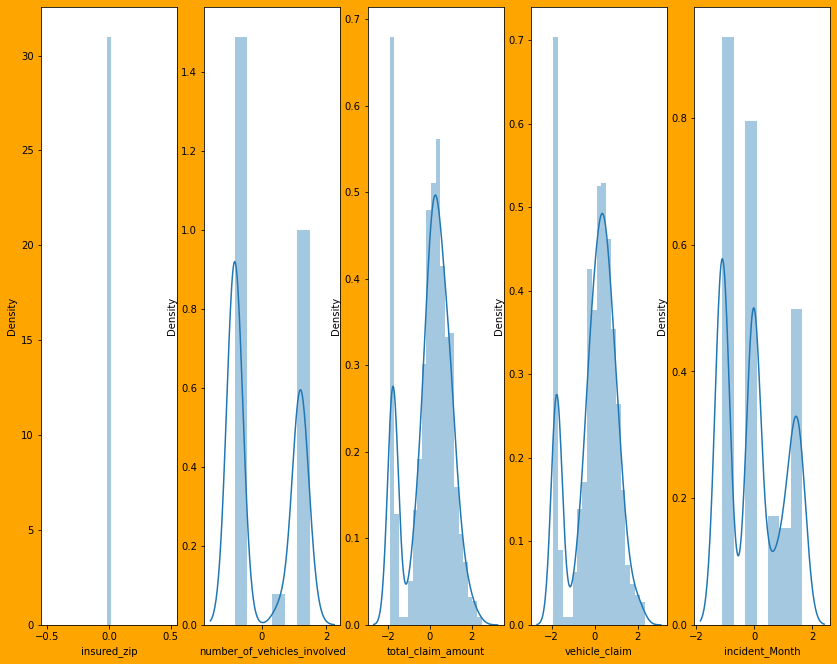

In [100]:
#After removing let's check how the data has been distributed in each column of skew_features.

plt.figure(figsize=(20,25), facecolor='orange')
plotnumber = 1

for column in df_new[L1]:
    if plotnumber<=9:
        ax = plt.subplot(2,7,plotnumber)
        sns.distplot(df_new[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

## We can see that all the columns have been Normalized Now and Skewness have been removed

<h2 style='text-align:center;font-size:60px;background-color:Black;border:30px;color:white'> Now Lets Split the dataset into dependent and independent variable <h2>

In [102]:
df_new.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month
0,328,48,2,1,1000,1406.91,0.0,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,-0.844799,1,1,2,1,0.717556,6510,13020,0.754553,10,2004,1,17,10,25,-1.101370
1,228,42,1,1,2000,1197.22,0.0,1,4,6,15,2,0,0,3,1,1,4,5,5,8,-0.844799,0,0,0,0,-1.777785,780,780,-1.787353,8,2007,1,27,6,21,-1.101370
2,134,29,2,0,2000,1413.14,0.0,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,1.187846,0,2,3,0,-0.716483,7700,3850,-0.820820,4,2007,0,9,6,22,-0.026479
3,256,41,0,1,2000,1415.74,0.0,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,-0.844799,0,1,2,0,0.392931,6340,6340,0.678427,3,2014,1,25,5,1,1.553647
4,228,44,0,2,1000,1583.91,0.0,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,-0.844799,0,0,1,0,-1.730555,1300,650,-1.740710,0,2009,0,6,6,17,-0.026479


In [103]:
x=df_new.loc [:,df_new.columns != 'fraud_reported']
# Independent Variable

In [104]:
y=df_new.loc[:,'fraud_reported']
#Dependent Variable

In [105]:
x.shape,y.shape

((996, 36), (996,))

<h2 style='text-align:center;font-size:50px;background-color:Black;border:50px;color:green'> Now Lets Scale The Dataset <h2>

In [106]:
from sklearn.preprocessing import StandardScaler

In [107]:
sc=StandardScaler()

x= pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month
0,1.074671,0.987190,1.186130,0.063660,-0.224722,0.621371,0.0,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.844799,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-0.182338,0.177487,1.013751,1.139807,-1.101370
1,0.204846,0.330455,-0.018137,0.063660,1.409024,-0.251375,0.0,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.844799,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,0.316587,1.309223,-0.166145,0.756374,-1.101370
2,-0.612790,-1.092470,1.186130,-1.179582,1.409024,0.647301,0.0,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.187846,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.316587,-0.727901,-0.166145,0.852233,-0.026479
3,0.448397,0.221000,-1.222403,0.063660,1.409024,0.658123,0.0,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.844799,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.480744,1.082875,-0.461119,-1.160788,1.553647
4,0.204846,0.549367,-1.222403,1.306902,-0.224722,1.358059,0.0,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.844799,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,0.649203,-1.067422,-0.166145,0.372942,-0.026479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,-1.752261,-0.107368,1.186130,1.306902,-0.224722,0.221354,0.0,-0.930144,1.044147,-1.162296,0.576073,0.942878,-0.900970,0.953763,0.765670,-1.404433,-0.197535,-0.760546,-1.500455,0.503546,1.200020,-0.844799,1.515920,-1.213749,-0.434257,-0.675382,1.341314,2.052922,0.278129,1.260237,-0.135276,0.150278,0.064313,0.128829,0.852233,-0.026479
992,0.700646,0.221000,-1.222403,-1.179582,-0.224722,0.745734,0.0,-0.930144,1.557206,0.580773,1.280299,1.537626,1.641225,0.953763,0.765670,-0.030351,-1.261019,-0.760546,0.352556,0.014247,1.631922,-0.844799,1.515920,1.228462,1.367910,-0.675382,2.205819,2.184148,2.229188,1.906028,1.601641,1.647052,-1.633290,-0.461119,1.043949,-1.101370
993,-0.647583,-0.545191,1.186130,0.063660,-1.041595,0.523896,0.0,-0.930144,1.044147,-1.411305,-1.184493,-0.246617,0.357578,0.953763,-1.083075,1.343731,-0.197535,1.196829,-1.500455,-1.453652,-1.103463,1.187846,-0.659665,1.228462,1.367910,1.480644,0.554684,0.014828,0.023825,0.778098,1.105379,-1.512803,0.177487,-1.346040,0.948091,-1.101370
994,2.205443,2.519571,-1.222403,1.306902,1.409024,0.413309,0.0,1.075102,-1.521148,-0.415266,-1.712663,1.537626,-0.900970,0.953763,0.765670,-0.030351,-1.261019,0.544370,-1.037202,-1.453652,-1.391398,-0.844799,-0.659665,-1.213749,-0.434257,1.480644,-0.246683,-0.452662,-0.451433,-0.103792,-1.375932,-1.180187,0.290661,1.308724,1.235665,-0.026479


## Now My Independent Variable have been Scaled

## WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)

In [108]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [109]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [110]:
vif_cal()

      VIF FACTOR                     FEATURES
0       6.841394           months_as_customer
1       6.848717                          age
2       1.037436                 policy_state
3       1.032888                   policy_csl
4       1.043181            policy_deductable
5       1.036350        policy_annual_premium
6            NaN                  insured_zip
7       1.029765                  insured_sex
8       1.043418      insured_education_level
9       1.016150           insured_occupation
10      1.050159              insured_hobbies
11      1.046786         insured_relationship
12      1.034993                capital-gains
13      1.040421                 capital-loss
14      6.320089                incident_type
15      1.045760               collision_type
16      1.238329            incident_severity
17      1.106020        authorities_contacted
18      1.043773               incident_state
19      1.030481                incident_city
20      1.095436     incident_hour

## total_claim_amount have the maximum multicollinearity so we will drop to minimize or eradicate multicollinearity

In [117]:
 # total_claim_amount is to be dropped here
x.drop("total_claim_amount",axis=1,inplace=True)

In [118]:
# Now check again
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [119]:
vif_cal()

    VIF FACTOR                     FEATURES
0     6.839178           months_as_customer
1     6.848685                          age
2     1.037413                 policy_state
3     1.031958                   policy_csl
4     1.041485            policy_deductable
5     1.035676        policy_annual_premium
6          NaN                  insured_zip
7     1.027012                  insured_sex
8     1.043384      insured_education_level
9     1.015407           insured_occupation
10    1.048234              insured_hobbies
11    1.046784         insured_relationship
12    1.034909                capital-gains
13    1.040284                 capital-loss
14    6.316767                incident_type
15    1.045552               collision_type
16    1.192452            incident_severity
17    1.083926        authorities_contacted
18    1.039249               incident_state
19    1.029424                incident_city
20    1.089804     incident_hour_of_the_day
21    6.331903  number_of_vehicl

## Now the multicollinearity have been removed,No Multicollinearity is present in the dataset...Here we can observe all the columns have VIF less than 10 which means we are free from multicollinearity problem. Let's move to buliding machine learning models...

In [120]:
x['insured_zip']

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
991    0.0
992    0.0
993    0.0
994    0.0
995    0.0
Name: insured_zip, Length: 996, dtype: float64

## it has max zero in the column so we will drop it

In [121]:
x.drop("insured_zip",axis=1,inplace=True)

# Balancing the dataset over here,otherwise it will be a baised dataset

In [122]:
from imblearn.over_sampling import SMOTE

In [123]:
smt=SMOTE()
x,y=smt.fit_resample(x,y)

In [124]:
x.shape,y.shape

((1500, 34), (1500,))

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

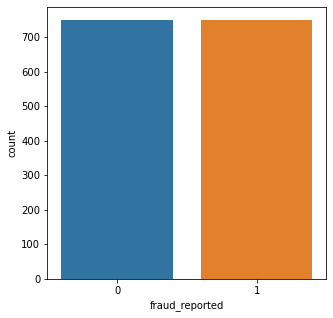

In [125]:
plt.figure(figsize=(5,5))
sns.countplot(y)

## Now my dataset is balanced

# Lets do PCA - Principal Component Analysis

In [126]:
from sklearn.decomposition import PCA

In [127]:
pca=PCA(n_components=10)

In [128]:
x=pca.fit_transform(x)
x

array([[ 0.1173171 ,  0.64977611, -1.06512565, ...,  0.34457645,
        -1.30111424, -1.61583462],
       [-3.27171333,  0.56141877, -1.01225299, ..., -0.2148564 ,
        -0.74806333,  0.86752879],
       [-0.36828946, -1.0610678 , -0.5970863 , ...,  0.62924222,
         0.99416419,  0.09770796],
       ...,
       [ 1.17666904,  1.73202081, -0.22935198, ..., -0.18864371,
         0.29224558, -0.28867442],
       [-0.79232574,  1.29231665,  1.91899874, ...,  0.15237045,
         1.05000343, -1.03406916],
       [ 0.79580891,  0.25675507,  1.22673883, ..., -0.60845298,
         1.63234082,  1.5478682 ]])

### Now Our dataset is Reduced to n_component = 10

# Model Training and Testing

In [130]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import train_test_split

In [131]:
lr=LogisticRegression()
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(accuracy_score(pred_train,y_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state ",i," The model performs very well")
        print("At random_state:-",i)
        print("Training accuaracy_score is :-",round(accuracy_score(y_train,pred_train)*100,1))
        print("Testing accuracy_score is:-",round(accuracy_score(y_test,pred_test)*100,1),  '\n\n')

At random state  63  The model performs very well
At random_state:- 63
Training accuaracy_score is :- 62.3
Testing accuracy_score is:- 62.3 


At random state  79  The model performs very well
At random_state:- 79
Training accuaracy_score is :- 62.7
Testing accuracy_score is:- 62.7 




In [132]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=79)

In [133]:
lr.fit(x_train,y_train)

LogisticRegression()

In [134]:
pred_train=lr.predict(x_train)

In [135]:
pred_test=lr.predict(x_test)

In [136]:
accuracy_score(y_test,pred_test)

0.6266666666666667

In [137]:
from sklearn.metrics import classification_report

In [138]:
print(classification_report(y_test,pred_test))

              precision    recall  f1-score   support

           0       0.66      0.63      0.64       161
           1       0.59      0.63      0.61       139

    accuracy                           0.63       300
   macro avg       0.63      0.63      0.63       300
weighted avg       0.63      0.63      0.63       300



# CROSS VALIDATION FOR LOGISTICS REGRESSION

In [139]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lss=accuracy_score(y_test,pred_lr)

In [140]:
for i in range(2,10):
    lsscore=cross_val_score(lr,x,y,cv=i)
    lsc=lsscore.mean()
    print ("At cv:-",i)
    print ("Cross validation score is :-",lsc*100)
    print ("Accuracy_score is :-",lss*100)
    print ("\n")

At cv:- 2
Cross validation score is :- 62.0
Accuracy_score is :- 62.66666666666667


At cv:- 3
Cross validation score is :- 62.66666666666666
Accuracy_score is :- 62.66666666666667


At cv:- 4
Cross validation score is :- 63.26666666666667
Accuracy_score is :- 62.66666666666667


At cv:- 5
Cross validation score is :- 62.33333333333333
Accuracy_score is :- 62.66666666666667


At cv:- 6
Cross validation score is :- 62.933333333333344
Accuracy_score is :- 62.66666666666667


At cv:- 7
Cross validation score is :- 63.13379079082188
Accuracy_score is :- 62.66666666666667


At cv:- 8
Cross validation score is :- 63.20293833200592
Accuracy_score is :- 62.66666666666667


At cv:- 9
Cross validation score is :- 62.53917867077091
Accuracy_score is :- 62.66666666666667




In [141]:
 # I will take CV as 3 bcz its close to accuracy score
lsscore_selected= cross_val_score(lr,x,y,cv=3).mean()
print ("The cv score is :- ",lsscore_selected,"\nThe accuracy_score is:",lss)

The cv score is :-  0.6266666666666666 
The accuracy_score is: 0.6266666666666667


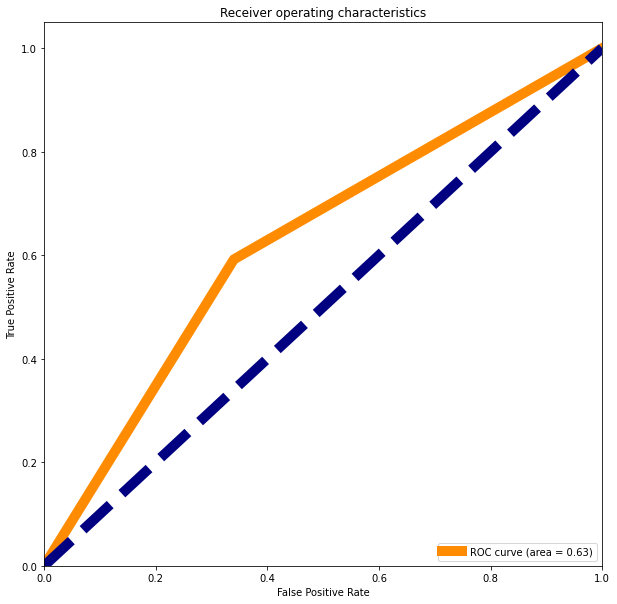

In [142]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

## 63% area is under Roc curve 

# `DECISION TREE CLASSIFIER`

In [143]:
# Checking Accuracy for Decision Tree Classifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

#Prediction
preddt = dt.predict(x_test)

print(accuracy_score(y_test, preddt))
print(confusion_matrix(y_test, preddt))
print(classification_report(y_test,preddt))
print('CV  :-',cross_val_score(dt,x,y,cv=5).mean())

0.6933333333333334
[[109  52]
 [ 40  99]]
              precision    recall  f1-score   support

           0       0.73      0.68      0.70       161
           1       0.66      0.71      0.68       139

    accuracy                           0.69       300
   macro avg       0.69      0.69      0.69       300
weighted avg       0.70      0.69      0.69       300

CV  :- 0.6866666666666668


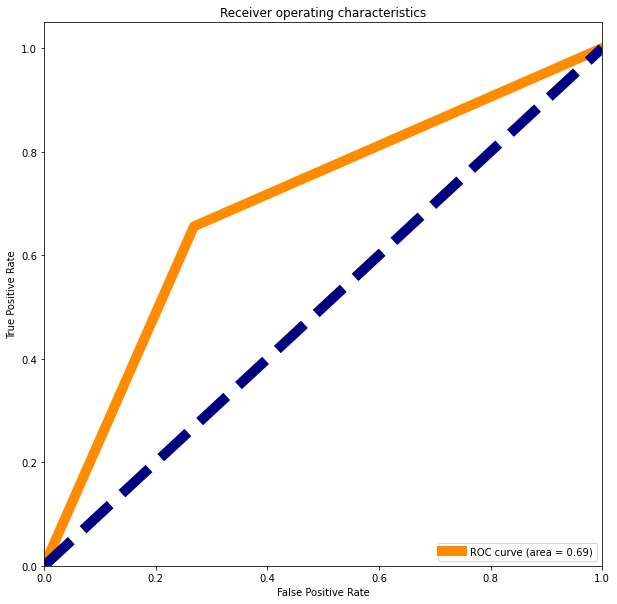

In [144]:
fpr,tpr,threshold=roc_curve(preddt,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

# 69% area is under Roc curve

#    `KNeighbors Classifier`

In [145]:
# Checking accuracy for KNeighbors Classifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

# Prediction
predknn = knn.predict(x_test)

print(accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test,predknn))
print('CV  :-',cross_val_score(knn,x,y,cv=5).mean())

0.7066666666666667
[[ 96  65]
 [ 23 116]]
              precision    recall  f1-score   support

           0       0.81      0.60      0.69       161
           1       0.64      0.83      0.72       139

    accuracy                           0.71       300
   macro avg       0.72      0.72      0.71       300
weighted avg       0.73      0.71      0.70       300

CV  :- 0.7553333333333334


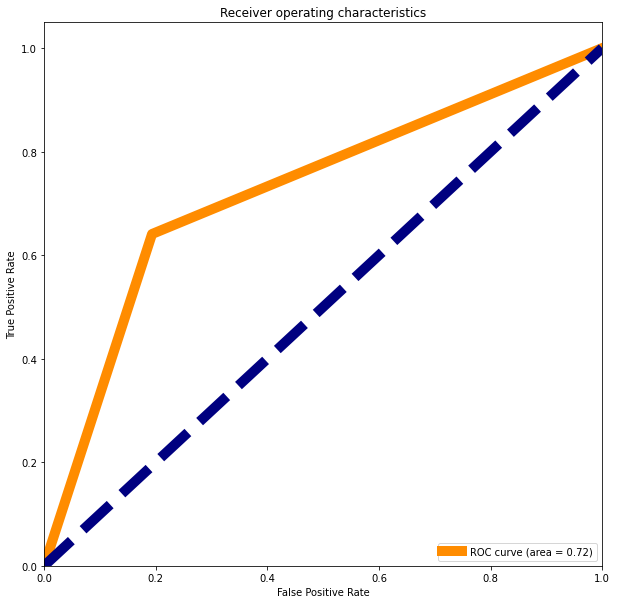

In [146]:
fpr,tpr,threshold=roc_curve(predknn,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

# 72% area is under Roc curve

# ENSEMBLE TECHNIQUE

In [147]:
# Checking accuracy for Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

# Prediction
predrf = rf.predict(x_test)

print(accuracy_score(y_test, predrf))
print(confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))
print('CV  :-',cross_val_score(rf,x,y,cv=5).mean())

0.78
[[124  37]
 [ 29 110]]
              precision    recall  f1-score   support

           0       0.81      0.77      0.79       161
           1       0.75      0.79      0.77       139

    accuracy                           0.78       300
   macro avg       0.78      0.78      0.78       300
weighted avg       0.78      0.78      0.78       300

CV  :- 0.7813333333333332


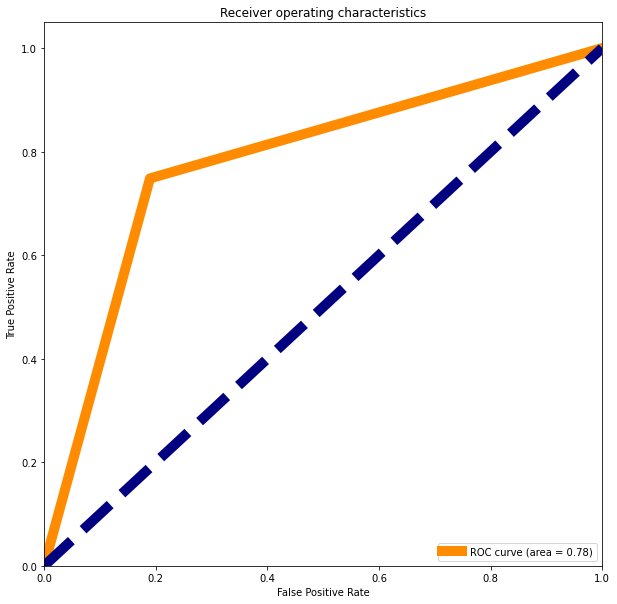

In [148]:
fpr,tpr,threshold=roc_curve(predrf,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

## 78% area is under Roc curve

In [150]:
# Checking accuracy for Gradient Boosting Classifier
gb = GradientBoostingClassifier()
gb.fit(x_train,y_train)

# Prediction
predgb = gb.predict(x_test)

print(accuracy_score(y_test, predgb))
print(confusion_matrix(y_test, predgb))
print(classification_report(y_test,predgb))

print('CV  :-',cross_val_score(gb,x,y,cv=5).mean())

0.6966666666666667
[[111  50]
 [ 41  98]]
              precision    recall  f1-score   support

           0       0.73      0.69      0.71       161
           1       0.66      0.71      0.68       139

    accuracy                           0.70       300
   macro avg       0.70      0.70      0.70       300
weighted avg       0.70      0.70      0.70       300

CV  :- 0.6846666666666666


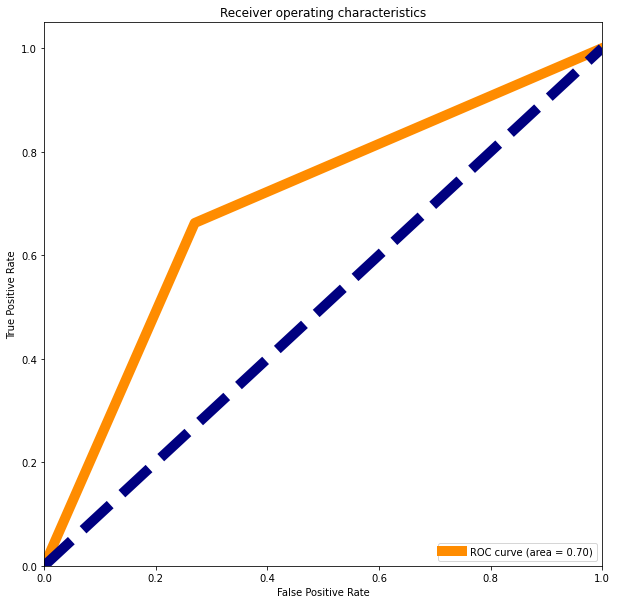

In [151]:
fpr,tpr,threshold=roc_curve(predgb,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

## 70% area is under Roc curve

In [152]:
from sklearn.ensemble import ExtraTreesClassifier

# Checking accuracy for Gradient Boosting Classifier
et = ExtraTreesClassifier()
et.fit(x_train,y_train)

# Prediction
predet = et.predict(x_test)

print(accuracy_score(y_test, predet))
print(confusion_matrix(y_test, predet))
print(classification_report(y_test,predet))

print('CV  :-',cross_val_score(et,x,y,cv=5).mean())


0.87
[[139  22]
 [ 17 122]]
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       161
           1       0.85      0.88      0.86       139

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300

CV  :- 0.8266666666666668


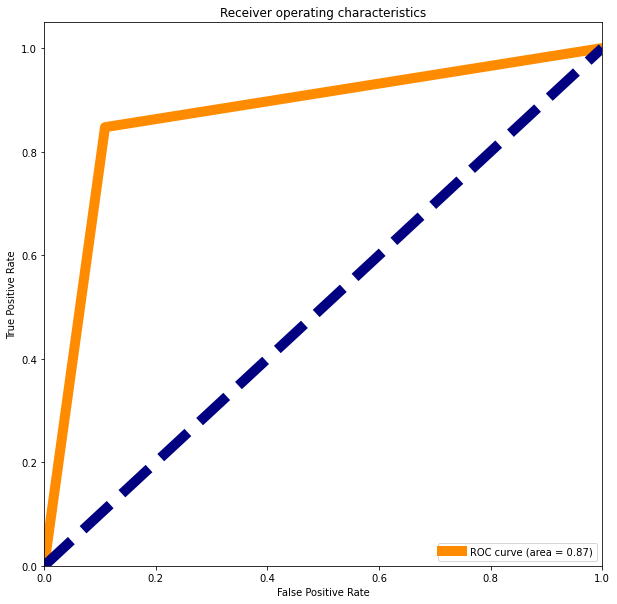

In [153]:
fpr,tpr,threshold=roc_curve(predet,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

# 87% area is under Roc curve

# Plotting ROC and compare AUC for all the models used

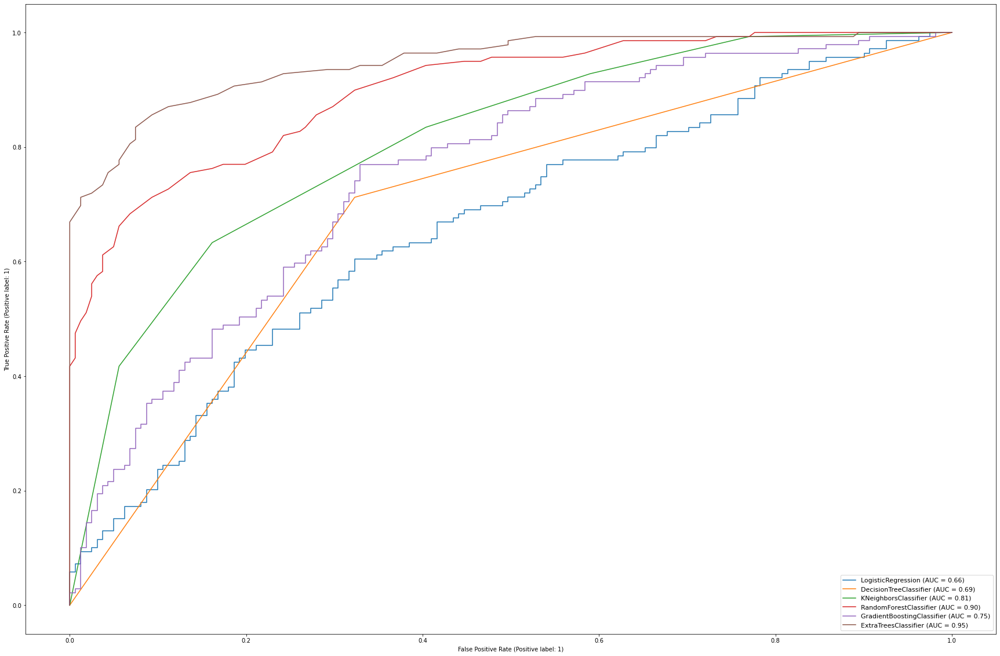

In [154]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 


disp=plot_roc_curve(lr, x_test, y_test)   
plot_roc_curve(dt, x_test, y_test, ax=disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rf, x_test, y_test, ax=disp.ax_)
plot_roc_curve(gb, x_test, y_test, ax=disp.ax_)
plot_roc_curve(et, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Making a dataframe of all the models accuracy score

In [155]:
mm=pd.DataFrame([["LR","63%"],["Decision Tree Classifier","69%"],["KNeighbors Classifier","71%"],["Random Forest Classifier","78%"],["Gradient Boosting","70%"],["Extra Tree Classifier","87%"]],
                    columns=["Model_Name","AccuracyScore"])

mm

,Model_Name,AccuracyScore
0,LR,63%
1,Decision Tree Classifier,69%
2,KNeighbors Classifier,71%
3,Random Forest Classifier,78%
4,Gradient Boosting,70%
5,Extra Tree Classifier,87%


# I will go for Extra Tree Classifier as it is the best performing model so far

# Hyperparameter Tuning

In [156]:
from sklearn.model_selection import GridSearchCV

In [157]:
et.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [158]:
#Extra Tree Classifier
parameters = {'criterion' : ['gini','entropy'],
              'random_state' : [10, 50, 100],
              'max_depth' : [0, 10, 20],
              'oob_score': [False,True],
              'warm_start' : [True,False]}


In [159]:
qq=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [160]:
qq.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20], 'oob_score': [False, True],
                         'random_state': [10, 50, 100],
                         'warm_start': [True, False]})

In [161]:
qq.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'oob_score': False,
 'random_state': 100,
 'warm_start': True}

In [162]:
et = ExtraTreesClassifier(criterion ='gini',max_depth=20, oob_score=False,warm_start=True,random_state=100)
et.fit(x_train, y_train)
pred = et.predict(x_test)
print('Accuracy_Score :-> ',accuracy_score(y_test,pred)*100)

Accuracy_Score :->  84.66666666666667


# Now Save the model

In [163]:
#Saving the model using .pkl
import joblib
joblib.dump(et,"ICFD_study.pkl")

['ICFD_study.pkl']

In [164]:
#Loading the saved model
aa=joblib.load("ICFD_study.pkl")

In [165]:
#Prediction
prediction = aa.predict(x_test)
prediction

array([0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1])

In [166]:
pd.DataFrame([aa.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
Predicted,0,0,1,1,1,1,1,0,1,1,1,0,1,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,1,1,1,1,1,0,1,0,0,1,0,1,1,1,1,0,1,1,1,0,0,1,1,0,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,1,1,0,1,0,1,0,1,1,0,1,1,0,0,1,1,0,0,1,1,1,0,1,0,1,1,1,0,1,0,0,1,1,1,1,1,0,1,1,1,1,0,1,1,0,0,1,0,0,1,0,1,1,0,0,1,1,0,1,1,0,0,0,1,0,1,1,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,1,1,0,1,1,0,1,1,1,1,1,0,0,1,1,1,1,0,1,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,1,1,0,0,1,1,0,1,1,1,0,0,1,0,0,0,1,1,0,1,0,1,1,1,0,1,0,0,1
Original,0,0,1,1,1,1,1,1,1,0,1,0,1,1,0,1,0,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,1,1,1,0,1,0,1,0,0,1,1,1,1,0,0,1,0,0,0,1,1,0,0,0,1,1,1,1,0,0,1,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,1,1,1,1,0,1,0,0,1,0,1,1,1,1,0,0,0,0,0,0,1,1,1,1,1,0,1,1,1,0,1,0,0,1,1,0,1,0,0,0,1,1,1,0,1,1,0,0,1,0,0,1,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,1,1,1,1,0,1,1,0,1,1,1,0,0,0,0,1,1,1,1,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,0,0,1,1,0,1,1,1,0,0,1,0,0,1,1,0,1,1,0,0,1,1,0,1,0,1,1


# My Model is performing Good and This project have been Completed

## ----------------------------------------------------------------------------------------